## 필요한 라이브러리 가져오기

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

## 사전 학습된 YOLOv8n 모델 연결

In [2]:
model = YOLO('yolov8n.pt')


image 1/1 D:\project\traffic density\sample_image.jpg: 384x640 5 cars, 180.3ms
Speed: 3.5ms preprocess, 180.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


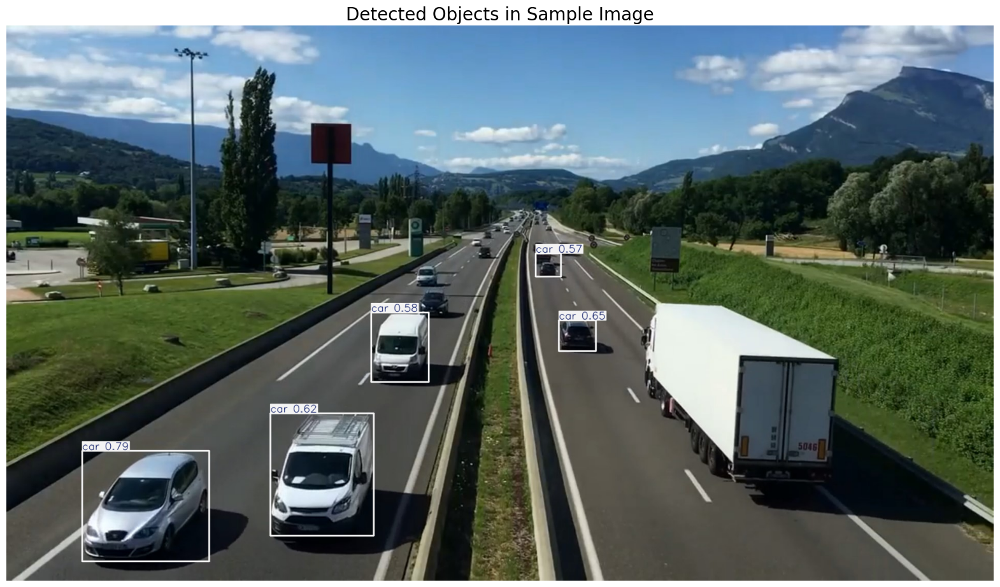

In [18]:
# 이미지 경로
image_path = "D:/project/traffic density/sample_image.jpg"

# 생성된 이미지 추론 // size: 640, 예측치: 0.5 이상만 출력
results = model.predict(source=image_path, imgsz= 640, conf=0.5)

# 이미지 numpy배열로 변환 
sample_image = results[0].plot(line_width=2)

# 이미지 BGR to RGB
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# 이미지 시각화
plt.figure(figsize=(20, 15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image', fontsize=20)
plt.axis('off')
plt.show()

## 데이터셋 탐색

In [4]:
# 데이터셋 경로
dataset_path = 'D:/project/traffic density/'

# YAML 파일 
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# YAML 파일 로드 및 출력
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



## 데이터셋 연결

In [5]:
# 훈련용, 검증용 이미지 경로 설정
train_images_path = os.path.join(dataset_path, 'train', 'images')

valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# 이미지 수 카운터 초기화
num_train_images = 0    
num_valid_images = 0

# 중복 제거 해상도 집합 생성 
train_image_sizes = set()   
valid_image_sizes = set()

# 훈련용 이미지 파일들 카운트 및 사이즈 확인
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# 확인용 이미지 파일들 카운트 및 사이즈 확인
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# 이미지 파일 갯수 출력
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# 훈련용 이미지 파일들 같은 사이즈인지 확인
if len(train_image_sizes) == 1:
    print(f"ALL training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# 확인용 이미지 파일들 같은 사이즈인지 확인
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 536
Number of validation images: 90
ALL training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


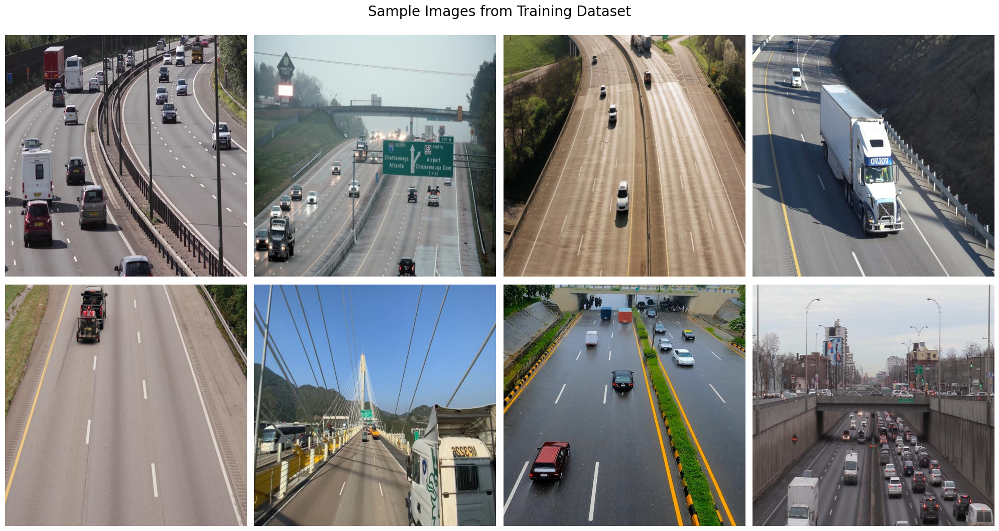

In [6]:
# 경로 속 모든 .jpg파일을 리스트로 가지고 옴
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# 8개 이미지 선택
num_images = len(image_files)    # 536
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]    # 536 ÷ 8 = 67 // 67번째마다 이미지 선택

# 2x4 표 생성
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# 시각화
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

## **미세 조정**

In [7]:
# 맞춤형 데이터셋 모델 훈련
results = model.train(
    data=yaml_file_path,     # 데이터셋
    epochs=100,              # 훈련 횟수
    imgsz=512,               # 이미지 사이즈 
    optimizer='auto',        # 옵티마이저 설정에 맞게 사용
    device=0,                # 쿠다 사용
    patience=50,             # 50 epoch 동안 성능 개선 안되면 학습 종료
    batch=16,                # batch수만큼 한 번에 학습
    workers=2                # 데이터 불러올 때 worker수만큼 프로세스 사용
)

New https://pypi.org/project/ultralytics/8.3.202 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.199  Python-3.10.18 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1050, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:/project/traffic density/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nm

In [19]:
# NOTE: YOLO 결과 기본 저장 경로 C:\Users\jinhyeongsik\runs\detect\
# 현재 프로젝트 내에서 D:\project\traffic density\runs\detect\train 로 이동

# 학습된 결과 경로 설정
post_training_files_path = 'D:/project/traffic density/runs/detect/train'

# 파일 확인
os.listdir(post_training_files_path)

['args.yaml',
 'BoxF1_curve.png',
 'BoxPR_curve.png',
 'BoxP_curve.png',
 'BoxR_curve.png',
 'confusion_matrix.png',
 'confusion_matrix_normalized.png',
 'labels.jpg',
 'results.csv',
 'results.png',
 'train_batch0.jpg',
 'train_batch1.jpg',
 'train_batch2.jpg',
 'train_batch3060.jpg',
 'train_batch3061.jpg',
 'train_batch3062.jpg',
 'val_batch0_labels.jpg',
 'val_batch0_pred.jpg',
 'val_batch1_labels.jpg',
 'val_batch1_pred.jpg',
 'val_batch2_labels.jpg',
 'val_batch2_pred.jpg',
 'weights']

## 손실값 그래프

In [20]:
# 손실 값에 대한 학습 곡선 함수
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', 
                 color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss',
                 color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')


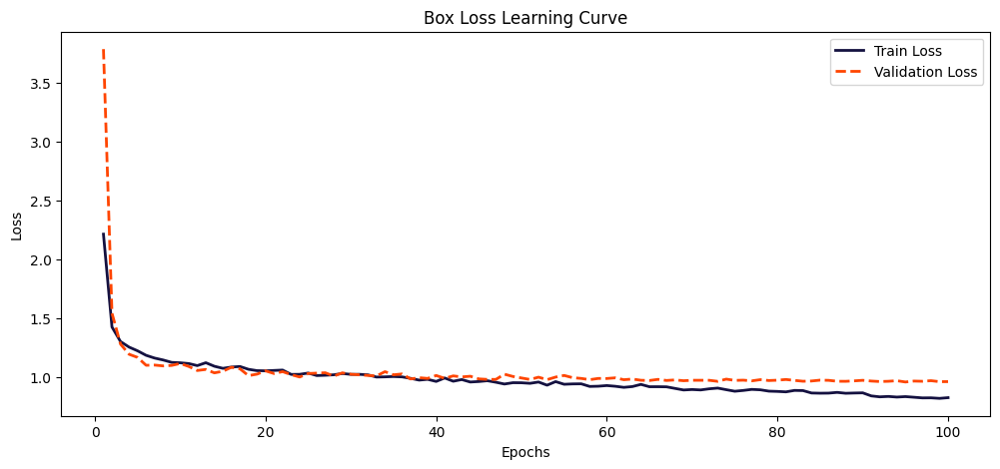

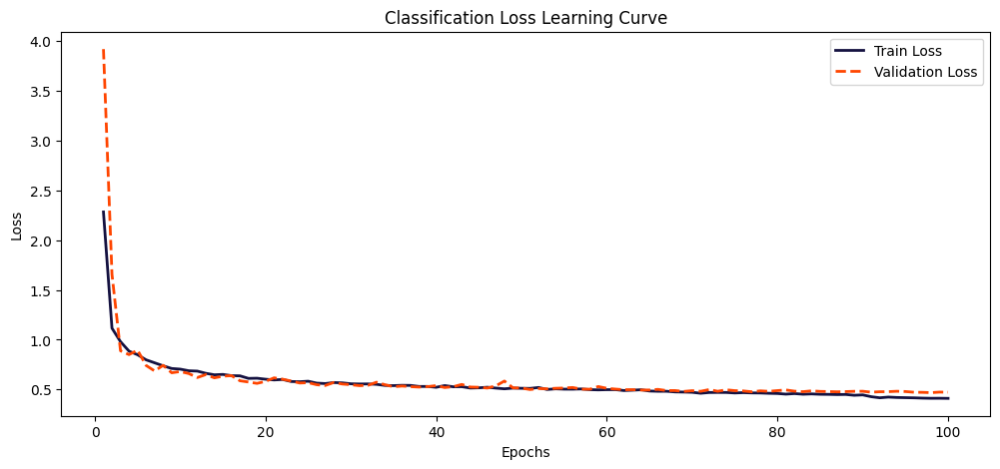

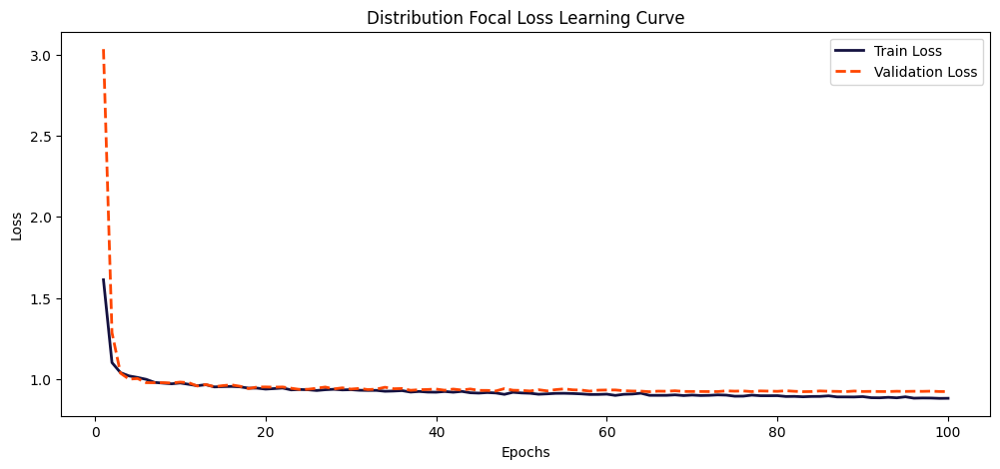

In [33]:
# csv파일 경로 설정
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# PandasDataframe으로 results_csv_path 연결
df = pd.read_csv(results_csv_path)

# 컬럼의 공백(띄어쓰기) 제거
df.columns = df.columns.str.strip()

print(df.columns)

# 학습률 그래프
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

## 모델 학습 곡선 분석
- 박스 손실, 분류 손실, 분포 초점 손실에 대한 학습 곡선은 초기 기간 동안 손실 값이 급격히 감소하며 훈련이 진행된다. 이는 평탄화된다는 것을 나타냅니다.
- 훈련용 손실과 검증용 손실이 크게 차이가 없는걸로 보아 효과적으로 학습을 하고 있는걸로 보입니다.
- 훈련 후기 기간에는 모델이 균형 상태에 도달했기에 더 이상 훈련으로 성능을 크게 향상시키지 못하는 것을 의미합니다.

## 정규화 행렬

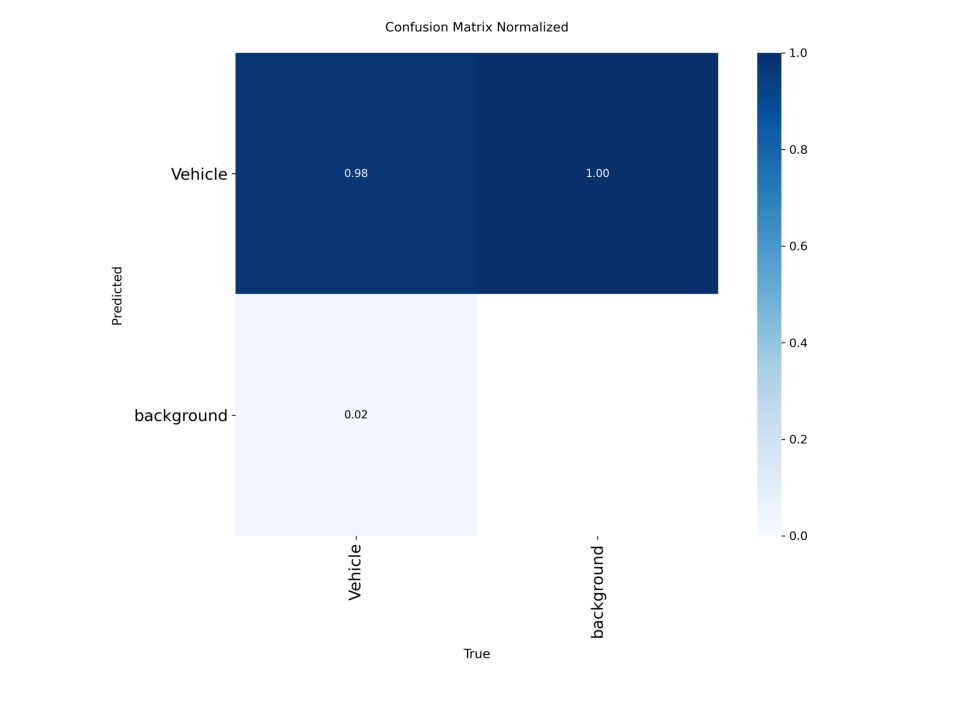

In [22]:
# 정규화 이미지 경로
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# 이미지 읽기
cm_img = cv2.imread(confusion_matrix_path)

# BGR to RGB
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# 시각화
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off')
plt.show()

## 행렬 분석
- 98%의 확률로 모델이 차량을 식별하는 감지 능력을 나타냅니다.
- 2% 확률로 차량을 감지 실패하는 경우가 있어서 좀 더 개선할 여지가 필요합니다.

## 가장 성능 좋은 모델 학습

In [23]:
# 100회중 가장 성능이 좋던 모델의 경로
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# 가장 성능 좋은 모델 학습
best_model =YOLO(best_model_path)

# 검증 데이터셋에 돌려서 성능 지표 확인
metrics = best_model.val(split='val')

Ultralytics 8.3.199  Python-3.12.11 torch-2.7.1+cpu CPU (Intel Core i5-7300HQ 2.50GHz)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 6.81.0 MB/s, size: 69.6 KB)
val: Scanning D:\project\traffic density\valid\labels.cache... 90 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 90/90  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 0.7it/s 9.0s1.9ss
                   all         90        937      0.916      0.941      0.977      0.736
Speed: 1.8ms preprocess, 73.2ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to C:\Users\jinhyeongsik\runs\detect\val


In [24]:
# NOTE: YOLO 결과 기본 저장 경로 C:\Users\jinhyeongsik\runs\detect\
# 현재 프로젝트 내에서 D:\project\traffic density\runs\detect\val 로 이동

# metrics 데이터프레임
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Dataframe 시각화
print(metrics_df.round(3))

                      Metric Value
metrics/precision(B)         0.916
metrics/recall(B)            0.941
metrics/mAP50(B)             0.977
metrics/mAP50-95(B)          0.736
fitness                      0.736


## metrics 성능 지표
- `precision(0.916)`: 차량이라고 예측한 것 중 실제 차량인 비율
- `Recall(0.941)`: 실제 차량을 모델이 얼마나 잘 찾아냈는지 비율
- `mAP50(0.977)`: IoU ≥ 0.5 기준 mAP(검출 성능), 97.7% 아주 높은 성능
- `mAP50-95(0.736)`: IoU 0.5~0.95 구간 평균 mAP, 73.6% 여전히 준수
- `Fitness`(0.736): mAP50-95 기반 내부 종합 평가 점수, 모델 선택 기준이 되는 값

## 모델 추론 및 평가

90

image 1/1 D:\project\traffic density\valid\images\10_mp4-0_jpg.rf.08b3bd34bbb73fb80c2d662c34474a98.jpg: 640x640 21 Vehicles, 150.1ms
Speed: 5.8ms preprocess, 150.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\project\traffic density\valid\images\11_mp4-15_jpg.rf.b1bdb8b4864b5bed3c78f1a70e2dc011.jpg: 640x640 13 Vehicles, 140.7ms
Speed: 4.1ms preprocess, 140.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\project\traffic density\valid\images\12_mp4-27_jpg.rf.2b272befa75f6ccd269223ccc84e5391.jpg: 640x640 6 Vehicles, 110.7ms
Speed: 4.0ms preprocess, 110.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\project\traffic density\valid\images\14_mp4-24_jpg.rf.57d5fe50d543f58e3b1f761ee53e1aa8.jpg: 640x640 7 Vehicles, 113.3ms
Speed: 3.9ms preprocess, 113.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\project\traffic density\valid\images\2_mp4-1_jpg.rf.b5

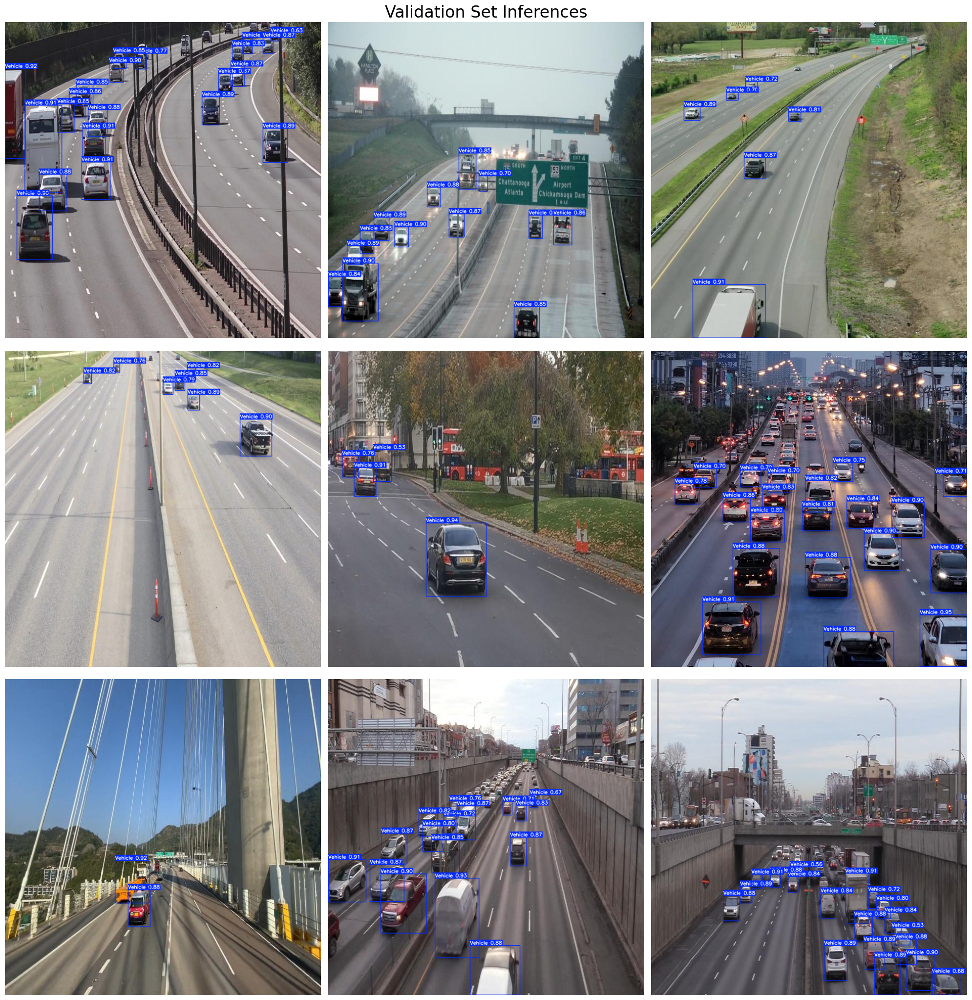

In [25]:
# 검증 이미지 경로
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# 검증 이미지 경로속 .jpg파일들 모두 리스트로 가지고 옴
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# 9개 이미지 선택
num_images = len(image_files)    # 90
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]    # 90 ÷ 9 = 10 // 10번째마다 이미지 선택
print(num_images)
# 3x3 표 생성
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# 시각화
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

## 가장 성능 좋은 모델 연결


image 1/1 D:\project\traffic density\sample_image.jpg: 384x640 9 Vehicles, 67.4ms
Speed: 3.1ms preprocess, 67.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


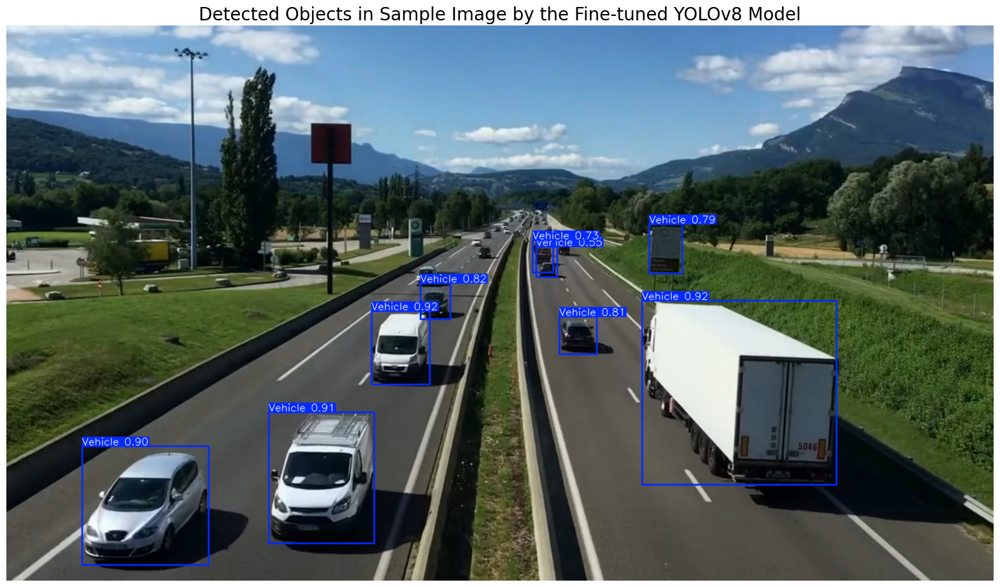

In [28]:
# NOTE: YOLO 결과 기본 저장 경로 C:\Users\jinhyeongsik\runs\detect\
# 현재 프로젝트 내에서 D:\project\traffic density\runs\detect\train 로 이동

# 가장 성능 좋은 모델 학습
best_model = YOLO(best_model_path)

# 이미지 경로
sample_image_path = "D:/project/traffic density/sample_image.jpg"

# 생성된 이미지 추론 // size: 640, 예측치: 0.5 이상만 출력
results = best_model.predict(source=sample_image_path, imgsz= 640, conf=0.5)

# 이미지 numpy배열로 변환 
sample_image = results[0].plot(line_width=2)

# 이미지 BGR to RGB
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# 이미지 시각화
plt.figure(figsize=(20, 15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

## **미세 조정을 통한 향상된 차량 감지**
- 사전 학습된 YOLOv8n 모델로 샘플 이미지를 Detection 하였을 땐 트럭을 감지 못하며 한계를 드러냈습니다. 하지만 미세 조정된 모델은 전에는 놓쳤던 트럭을 감지했을뿐만 아니라 예측 점수 또한 높아진 것을 확인할 수 있습니다. 개선된 모델은 차량에 특화된 특징을 식별하는 능력을 향상하여 차량 감지에서 더 나은 정밀도와 재현율을 제공합니다. 
- 하지만 아직 멀리 있는 차량은 잘 탐지하지 못하고 있습니다. 따라서 멀리 있는 객체 또한 Detection하도록 여러 가지 방법을 시도할 것입니다.

### **1. 추론시 이미지 사이즈 키우기**


WARNING imgsz=[1960] must be multiple of max stride 32, updating to [1984]
image 1/1 D:\project\traffic density\sample_image.jpg: 1120x1984 10 Vehicles, 555.0ms
Speed: 31.3ms preprocess, 555.0ms inference, 1.3ms postprocess per image at shape (1, 3, 1120, 1984)


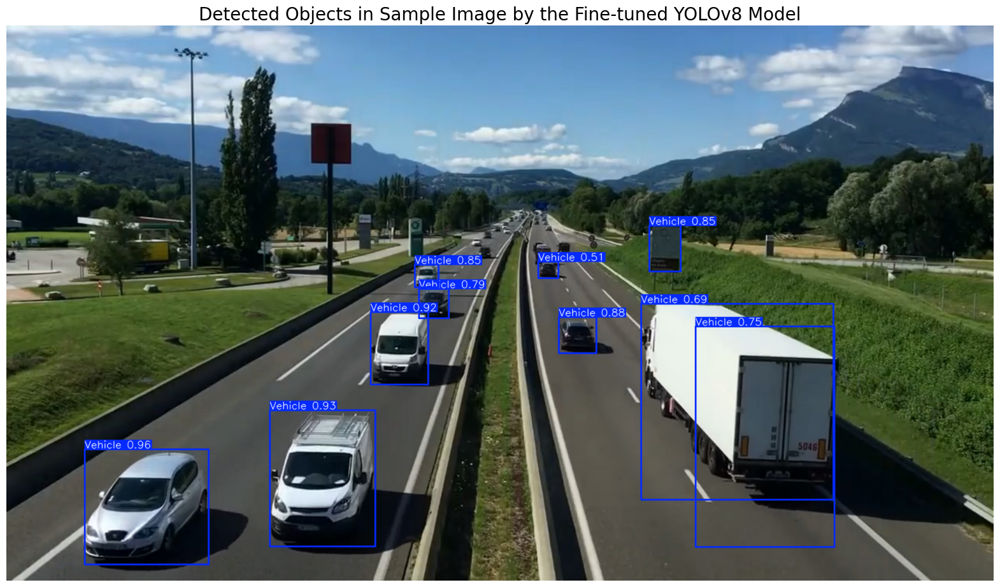

저장 완료: sample_detected.png


In [29]:
# 가장 성능 좋은 모델 학습
best_model = YOLO(best_model_path)

# 이미지 경로
sample_image_path = "D:/project/traffic density/sample_image.jpg"

# 생성된 이미지 추론 // size: 1960, 예측치: 0.5 이상만 출력
results = best_model.predict(source=sample_image_path, imgsz= 1960, conf=0.5)

# 이미지 numpy배열로 변환 
sample_image = results[0].plot(line_width=2)

# 이미지 BGR to RGB
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# 이미지 시각화
plt.figure(figsize=(20, 15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()


# ---- 저장 (cv2.imwrite) ----
# RGB → BGR 다시 변환 후 저장
save_image = cv2.cvtColor(sample_image, cv2.COLOR_RGB2BGR)
cv2.imwrite('D:/project/traffic density/After training.png', save_image)
print("저장 완료: sample_detected.png")

### **2. 훈련시 이미지 사이즈 키우기**

In [17]:
# 맞춤형 데이터셋 모델 훈련
results = model.train(
    data=yaml_file_path,     # 데이터셋
    epochs=100,              # 훈련 횟수
    imgsz=640,               # 이미지 사이즈 
    optimizer='auto',        # 옵티마이저 설정에 맞게 사용
    device=0,                # 쿠다 사용
    patience=50,             # 50 epoch 동안 성능 개선 안되면 학습 종료
    batch=2,                # batch수만큼 한 번에 학습
    workers=2                # 데이터 불러올 때 worker수만큼 프로세스 사용
)

New https://pypi.org/project/ultralytics/8.3.204 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.199  Python-3.10.18 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1050, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:/project/traffic density/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train11, nbs=64, nm

RuntimeError: DataLoader worker (pid(s) 8712) exited unexpectedly

In [12]:
# NOTE: YOLO 결과 기본 저장 경로 C:\Users\jinhyeongsik\runs\detect\
# 현재 프로젝트 내에서 D:\project\traffic density\runs\detect\sizeup_train 로 이동

# 학습된 결과 경로 설정
post_training_files_path = 'D:/project/traffic density/runs/detect/sizeup_train'

# 파일 확인
os.listdir(post_training_files_path)

# 100회중 가장 성능이 좋던 모델의 경로
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# 가장 성능 좋은 모델 학습
best_model =YOLO(best_model_path)

# 이미지 경로
sample_image_path = "D:/project/traffic density/sample_image.jpg"

# 생성된 이미지 추론 // size: 640, 예측치: 0.5 이상만 출력
results = best_model.predict(source=sample_image_path, imgsz= 1960, conf=0.5)

# 이미지 numpy배열로 변환 
sample_image = results[0].plot(line_width=3)

# 이미지 BGR to RGB
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# 이미지 시각화
plt.figure(figsize=(20, 15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()


WARNING imgsz=[1960] must be multiple of max stride 32, updating to [1984]
image 1/1 D:\project\traffic density\sample_image.jpg: 1120x1984 11 Vehicles, 58.6ms
Speed: 28.5ms preprocess, 58.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1120, 1984)


<Figure size 2000x1500 with 1 Axes>

### **3. 타일 추론**
- 원본 이미지 여러 장으로 쪼개서 각각 추론

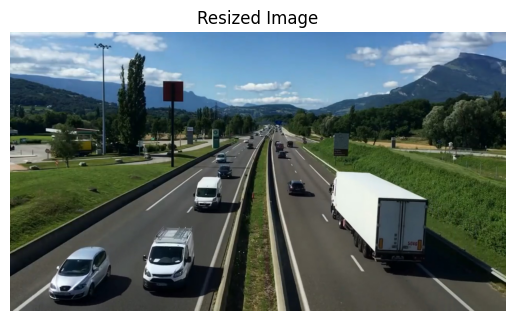

In [17]:
# 이미지 경로
sample_image_path = "D:/project/traffic density/sample_image.jpg"

# 원본 이미지 사이즈 1920x1080
img = cv2.imread(sample_image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (1920, 1080))

# 시각화
plt.imshow(img)
plt.title("Resized Image")
plt.axis("off")
plt.show()

tile[0,0] y:0-640, x:0-640, size=(640, 640)
tile[0,1] y:0-640, x:560-1200, size=(640, 640)
tile[0,2] y:0-640, x:1120-1760, size=(640, 640)
tile[0,3] y:0-640, x:1280-1920, size=(640, 640)
tile[1,0] y:440-1080, x:0-640, size=(640, 640)
tile[1,1] y:440-1080, x:560-1200, size=(640, 640)
tile[1,2] y:440-1080, x:1120-1760, size=(640, 640)
tile[1,3] y:440-1080, x:1280-1920, size=(640, 640)


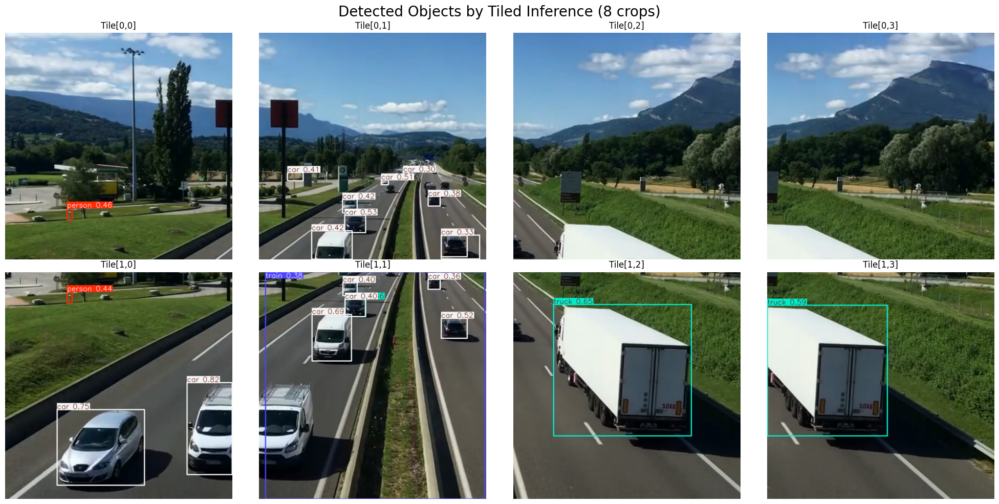

In [18]:
height, width = img.shape[:2]
tile, overlap = 640, 80
step = tile - overlap    # 총 8개 타일 // width: 0~640, 560~1200, 1120~1760, 1280~1920 // height: 0~640, 440~1080

# 타일 시작점
xs = [0, step, 2*step, width-tile]    # [0, 560, 1120, 1280]
ys = [0, height-tile]                 # [0, 440]

plt.figure(figsize=(20, 10))

plot_idx = 1

for yi, y in enumerate(ys):
    for xi, x in enumerate(xs):
        x2, y2 = x + tile, y + tile
        crop = img[y:y2, x:x2]
        print(f"tile[{yi},{xi}] y:{y}-{y2}, x:{x}-{x2}, size={crop.shape[:2]}")
        # 모델 추론
        results = model.predict(crop, imgsz=640, conf=0.3, verbose=False)
        sample_image = results[0].plot(line_width=2)

        # subplot에 출력
        plt.subplot(2, 4, plot_idx)
        plt.imshow(sample_image)
        plt.title(f"Tile[{yi},{xi}]")
        plt.axis('off')
        plot_idx += 1

plt.suptitle("Detected Objects by Tiled Inference (8 crops)", fontsize=20)
plt.tight_layout()
plt.show()

## 동영상 추론

In [19]:
# 동영상 경로
video_path = 'D:/project/traffic density/sample_video.mp4'

# 동영상 추론
best_model.predict(source=video_path, save=True)


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) D:\project\traffic density\sample_video.mp4: 384x640 2 Vehicles, 14.6ms
video 1/1 (frame 2/601) D:\project\traffic density\sample_video.mp4: 384x640 2 Vehicles, 12.5ms
video 1/1 (frame 3/601) D:\project\traffic density\sample_video.mp4: 384x640 2 Vehicles, 13.8ms
video 1/1 (frame 4/601) D:\project\traffic density\sample_video.mp4: 384x640 3 Vehicles, 13.5ms
video 1/1 (frame 5/601) D:\project\traffic density\sample_video.mp4: 384x64

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Vehicle'}
 obb: None
 orig_img: array([[[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[254, 246, 241],
         [254, 246, 241],
         [254, 246, 241],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        ...,
 
        [[ 94, 104, 103],
         [ 96, 106, 105],
         [101, 111, 110],
         ...,
         [ 94, 106, 111],
         [ 95, 107, 112],
         [ 97, 109, 114]],
 
        [[ 98, 108, 107],
         [103, 113, 112],
         [100, 110, 109],
         ...,
         [ 95, 10

In [ ]:
# NOTE: YOLO 결과 기본 저장 경로 C:\Users\jinhyeongsik\runs\detect\
# 현재 프로젝트 내에서 D:\project\traffic density\predict\로 이동

ff = r"C:/Users/jinhyeongsik/anaconda3/envs/pytorch_env/Library/bin/ffmpeg.exe"
src = r"D:/project/traffic density/predict/sample_video.avi"
dst = r"D:/project/traffic density/predict/processed_sample_video.mp4"

!"{ff}" -y -loglevel error -i "{src}" -c:v libx264 -pix_fmt yuv420p "{dst}"

from IPython.display import Video
Video(dst, embed=True, width=960)

## 🎥 추론 결과

YOLOv8 추론 후 결과 영상은 `Video_results/processed_sample_video.mp4` 에 저장되었습니다.  

아래 이미지는 결과 영상의 일부 프레임 캡처입니다:

![Sample Result](Video_results/frame_sample1.jpg)

➡ 전체 영상은 [processed_sample_video.mp4](Video_results/processed_sample_video.mp4) 파일에서 확인할 수 있습니다.

In [15]:
best_model =YOLO(best_model_path)

# 혼잡도 차량 수 설정
heavy_traffic_threshold = 3

# 구역 설정 
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)    # 11시 · 1시 · 5시 · 7시 방향
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)   

# 누적 카운트 비교할 경계선, 이미지 자를 범위 설정
y1, y2 = 325, 635 
lane_threshold = 609

# 영상 속 텍스트 위치
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)
Left_past_vehicle_total = (10, 150)
Right_past_vehicle_total = (820, 150)

# 폰트 스타일, 크기, 색깔, 배경 설정
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text
        
# 비디오 열기
cap = cv2.VideoCapture('D:/project/traffic density/sample_video.mp4')

# 코덱 정의 및 동영상 파일 저장
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('D:/project/traffic density/traffic_density_analysis.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# 각 추적 ID의 이전 중심 x 저장
prev_x = {}
left_total = 0
right_total = 0

# Ultralytics 내장 ByteTrack 설정 파일 사용
tracker_cfg = "D:/project/traffic density/bytetrack.yaml"

# 캠이 열려있으면 True // 영상이 끝날 때까지 반복
while cap.isOpened():
    # 한 프레임씩 읽기
    ret, frame = cap.read()
    if ret:
        # 프레임 복사본 만들기
        detection_frame = frame.copy()
    
        # 관심영역 마스킹
        detection_frame[:y1, :] = 0  # 위쪽 검정색
        detection_frame[y2:, :] = 0  # 아래쪽 검정색
        
        # 관심영역 모델 트래킹 수행
        results = best_model.track(detection_frame,
                                   imgsz=640,
                                   conf=0.4,
                                   tracker=tracker_cfg,
                                   persist=True,
                                   verbose=False,
                                   device=0)[0]  
        
        processed_frame = results.plot(line_width=2)    
        
        # 마스킹 부분 원본으로 복구
        processed_frame[:y1, :] = frame[:y1, :].copy()
        processed_frame[y2:, :] = frame[y2:, :].copy()        
        
        # 원본속 관심 영역 폴리곤
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)    # isClosed=True 다각형의 마지막 점, 첫번째 점 연결하여 닫힌 도형 만듬
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(0, 255, 0), thickness=2)

        # 현재 프레임 "순간" 카운트
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0

        boxes = results.boxes  

        # print(boxes.xyxy) 바운딩 박스 좌표
        # print(boxes.conf) confidence 값
        # print(boxes.cls) 클래스 ID
        # print(boxes.id) 추적 ID ( predict()에는 없고, track()에서만 존재)
        
        if boxes is not None:
        # track()를 썼을 때만 boxes.id 존재
            ids = getattr(boxes, "id", None)    # getattr(obj , "속성", 기본값) → 속성이 있으면 가져오고, 없을시 None
            xyxy = boxes.xyxy.cpu().numpy() if boxes.xyxy is not None else None
            track_ids = ids.int().cpu().numpy() if ids is not None else None

            if xyxy is not None:
                # 순간 카운트
                for b in xyxy:
                    if b[0] < lane_threshold:    # b[0]: 왼쪽 모서리 좌표값
                        vehicles_in_left_lane += 1
                    else:
                        vehicles_in_right_lane += 1

               # 누적 카운트
            if (track_ids is not None) and (xyxy is not None):    # 둘 다 존재할 때 실행
                # 가상의 기준선 (y값) 설정
                line_y = (y1 + y2) // 2   # 관심 영역 중간선

                for (x1b, y1b, x2b, y2b), tid in zip(xyxy, track_ids):
                    cx = int((x1b + x2b) / 2)    # 차량 중심 x좌표
                    cy = int((y1b + y2b) / 2)    # 차량 중심 y좌표

                    if tid in prev_x:
                        px, py = prev_x[tid]

                        # 왼쪽 차선 (x < lane_threshold): 위 -> 아래
                        if cx < lane_threshold and (py < line_y <= cy):
                            left_total += 1

                        # 오른쪽 차선 (x >= lane_threshold): 아래 -> 위
                        elif cx >= lane_threshold and (py > line_y >= cy):
                            right_total += 1

                    # 상태 업데이트 (이전 중심 좌표 저장)
                    prev_x[tid] = (cx, cy)
           
        # 혼잡도 텍스트
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"

        # 왼쪽 현재 차량 수
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25), 
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # 왼쪽 혼잡도
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25), 
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # 왼쪽 누적 통과
        cv2.rectangle(processed_frame, (Left_past_vehicle_total[0]-10, Left_past_vehicle_total[1] - 25), 
                      (Left_past_vehicle_total[0] + 460, Left_past_vehicle_total[1] + 10), background_color, -1)
        cv2.putText(processed_frame, f'Left past vehicle total: {left_total}', Left_past_vehicle_total,
                    font, font_scale, font_color, 2, cv2.LINE_AA)     
        
        # 오른쪽 현재수
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25), 
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # 오른쪽 혼잡도
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25), 
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # 오른쪽 누적 통과
        cv2.rectangle(processed_frame, (Right_past_vehicle_total[0]-10, Right_past_vehicle_total[1] - 25), 
                      (Right_past_vehicle_total[0] + 460, Right_past_vehicle_total[1] + 10), background_color, -1)
        cv2.putText(processed_frame, f'Right past vehicle total: {right_total}', Right_past_vehicle_total,
                       font, font_scale, font_color, 2, cv2.LINE_AA)
        
        # 결과 저장
        out.write(processed_frame)

    else:
        break

# 마무리
cap.release()
out.release()
# cv2.destroyAllWindows()

In [ ]:
ff = r"C:/Users/jinhyeongsik/anaconda3/envs/pytorch_env/Library/bin/ffmpeg.exe"
src = r"D:/project/traffic density/traffic_density_analysis.avi"
dst = r"D:/project/traffic density/predict/traffic_density_analysis.mp4"

!"{ff}" -y -loglevel error -i "{src}" -c:v libx264 -pix_fmt yuv420p "{dst}"

from IPython.display import Video
Video(dst, embed=True, width=960)

## 🎥 추론 결과

YOLOv8 추론 후 결과 영상은 `Video_results/traffic_density_analysis.mp4` 에 저장되었습니다.  

아래 이미지는 결과 영상의 일부 프레임 캡처입니다:
![Sample Result](Video_results/frame_sample2.jpg)

➡ 전체 영상은 [traffic_density_analysis.mp4](results/traffic_density_analysis.mp4) 파일에서 확인할 수 있습니다.